# **Preparing Dependancies**

In [1]:
!pip install -q --upgrade diffusers safetensors

import os
import gc
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFilter
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionInpaintPipeline,
    StableDiffusionImg2ImgPipeline,
    EulerAncestralDiscreteScheduler,
    DPMSolverMultistepScheduler,
    DDIMScheduler,
)
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE  = torch.float16 if DEVICE == "cuda" else torch.float32
print(f"Device: {DEVICE} | dtype: {DTYPE}")

PROMPT = (
    "an astronaut with full white spacesuit, standing on a flat moon plain, "
    "with earth in the background, minimal detail, 2D digital illustration"
)
NEG_PROMPT = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration."
)
SEED = 222


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 132.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 509.1/509.1 kB 33.0 MB/s eta 0:00:00


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Device: cuda | dtype: torch.float16


# **Kriteria 1: Melakukan Image Generation dari Teks (Text-to-Image)**

## **Load Base Pipeline Model**

In [2]:
MODEL_ID = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=DTYPE,
    safety_checker=None,
    requires_safety_checker=False,
).to(DEVICE)

pipe.set_progress_bar_config(disable=False)
print("Base pipeline siap.")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Base pipeline siap.


## **Generate Image**

  0%|          | 0/50 [00:00<?, ?it/s]

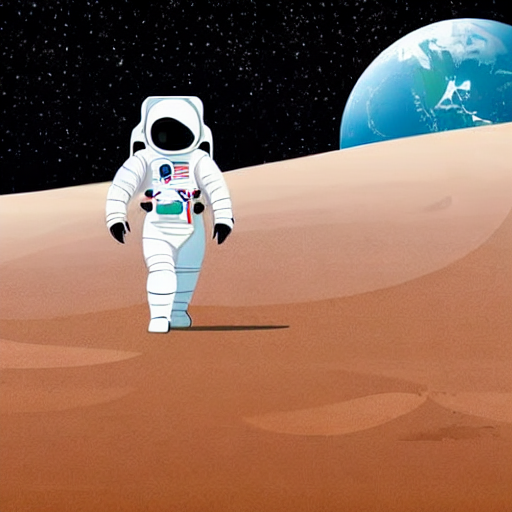

In [3]:
def generate_simple_image(prompt, negative_prompt, seed):
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
    ).images[0]
    return image


img_simple = generate_simple_image(PROMPT, NEG_PROMPT, SEED)
img_simple


## **Generate Image with Hyperparameter Configuration**

  0%|          | 0/50 [00:00<?, ?it/s]

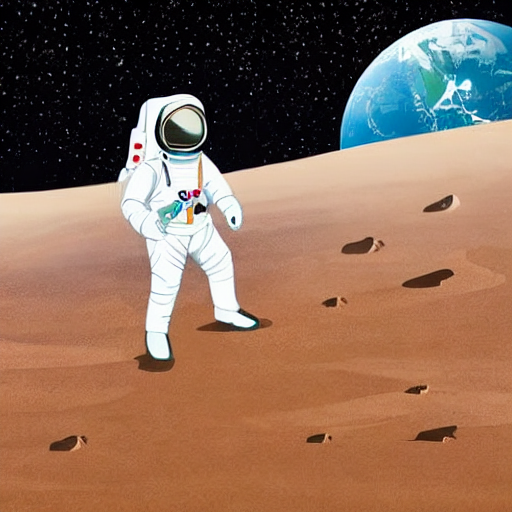

In [4]:
def generate_advanced_image(
    prompt,
    negative_prompt,
    seed,
    guidance_scale=5.0,
    num_inference_steps=50,
):
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
    ).images[0]
    return image


img_advanced = generate_advanced_image(
    PROMPT, NEG_PROMPT, SEED,
    guidance_scale=5.0,
    num_inference_steps=50,
)
img_advanced


## **Guidance Scale Comparison**

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

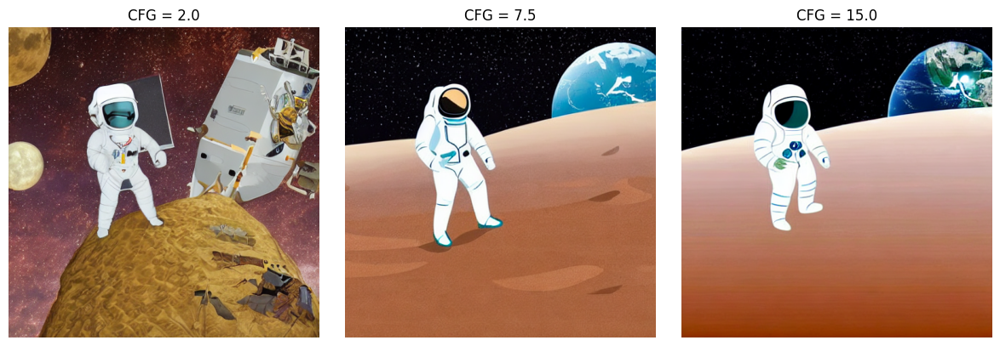

In [5]:
def show_grid(images, titles, cols=None, figsize=None):
    n = len(images)
    cols = cols or n
    rows = (n + cols - 1) // cols
    figsize = figsize or (4 * cols, 4 * rows)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).reshape(-1)
    for ax, img, t in zip(axes, images, titles):
        ax.imshow(img); ax.set_title(t); ax.axis("off")
    for ax in axes[len(images):]:
        ax.axis("off")
    plt.tight_layout(); plt.show()


cfg_values = [2.0, 7.5, 15.0]
imgs_cfg = [
    generate_advanced_image(PROMPT, NEG_PROMPT, SEED, guidance_scale=c, num_inference_steps=30)
    for c in cfg_values
]
show_grid(imgs_cfg, [f"CFG = {c}" for c in cfg_values])


### **Guidance Scale Explanation:**

*   **Gambar dengan "Scale" Rendah (CFG = 2.0):**
    Hasil cenderung lebih bebas dan kreatif, namun korespondensinya dengan prompt sangat lemah. Beberapa elemen kunci pada prompt (misal "wizard hat" atau "magical glowing forest") sering tidak muncul atau muncul tidak jelas. Komposisi terasa lebih "natural" dan variatif tetapi sering kehilangan fokus subjek utama, dan detail terlihat kurang tajam karena model kurang dipaksa mengikuti teks.

*   **Gambar dengan "Scale" Tinggi (CFG = 15.0):**
    Sebaliknya, model sangat patuh pada prompt: hampir semua elemen yang diminta muncul (rubah, topi penyihir, hutan magis, warna terang). Detail cenderung lebih tegas dan kontras lebih kuat. Namun konsekuensinya adalah munculnya artefak over-saturated, garis kontur yang terlalu tajam ("burned" look), dan tekstur yang kadang terasa tidak natural. Variasi visual berkurang karena ruang sampling-nya menjadi lebih sempit.

Sweet spot untuk Stable Diffusion 1.5 biasanya berada di sekitar CFG 7-10: cukup mengikuti prompt tanpa kehilangan kualitas estetik.


## **Inference Steps Comparison**

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

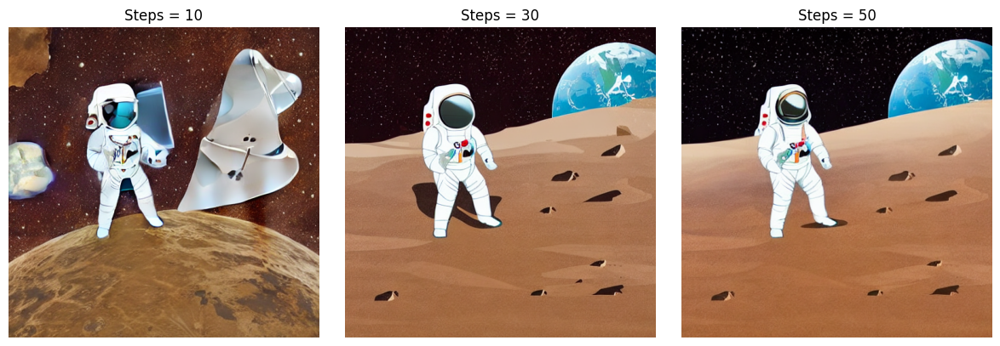

In [6]:
step_values = [10, 30, 50]
imgs_steps = [
    generate_advanced_image(PROMPT, NEG_PROMPT, SEED, guidance_scale=4.5, num_inference_steps=s)
    for s in step_values
]
show_grid(imgs_steps, [f"Steps = {s}" for s in step_values])


### **Inference Step Explanation:**

*   **Gambar dengan "Step" Rendah (10 steps):**
    Komposisi keseluruhan sudah terbentuk, tetapi banyak area yang masih "setengah jadi": tekstur bulu rubah terlihat blocky, latar hutan tampak buram, dan terkadang muncul artefak noise/grain pada area gelap. Detail halus seperti mata, ujung topi, atau cahaya partikel sering belum terbentuk dengan baik karena denoising dihentikan terlalu dini.

*   **Gambar dengan "Step" Tinggi (50 steps):**
    Hasil jauh lebih halus dan stabil. Tekstur, gradasi pencahayaan, serta detail mikro (mata, urat daun, partikel cahaya) menjadi lebih kaya. Perbedaan dari step 30 ke 50 biasanya kecil dan mengikuti hukum *diminishing returns*: setelah 30-40 step, peningkatan visual sangat marjinal sementara waktu komputasi tumbuh linear. Untuk Stable Diffusion 1.5, 25-40 step umumnya sudah optimal.


## **Batch Inference from One Prompt**

  0%|          | 0/40 [00:00<?, ?it/s]

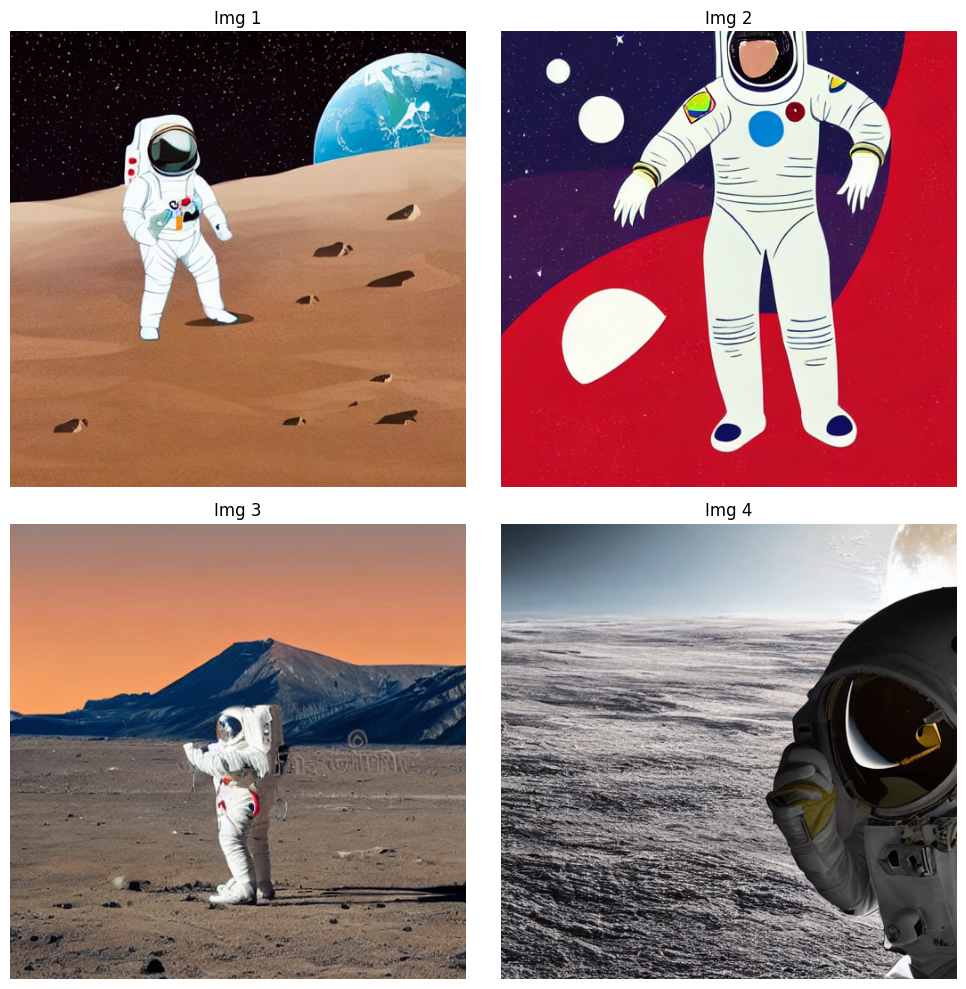

In [7]:
def generate_batch(prompt, negative_prompt, seed, num_images=4,
                   guidance_scale=4.5, num_inference_steps=40):
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    out = pipe(
        prompt=[prompt] * num_images,
        negative_prompt=[negative_prompt] * num_images,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
    )
    return out.images


batch_imgs = generate_batch(PROMPT, NEG_PROMPT, SEED, num_images=4)
show_grid(batch_imgs, [f"Img {i+1}" for i in range(4)], cols=2, figsize=(10, 10))


## **Load Scheduler**

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

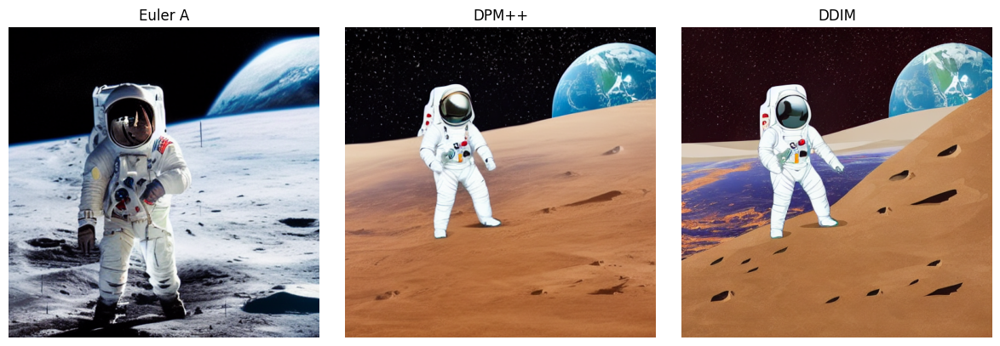

In [8]:
def load_scheduler(pipe, scheduler_name):
    name = scheduler_name.lower().replace(" ", "").replace("-", "")
    cfg = pipe.scheduler.config
    if name in ("eulera", "eulerancestral", "euler_a"):
        pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(cfg)
    elif name in ("dpm++", "dpmpp", "dpmsolver++", "dpmsolverpp"):
        pipe.scheduler = DPMSolverMultistepScheduler.from_config(
            cfg, algorithm_type="dpmsolver++"
        )
    elif name == "ddim":
        pipe.scheduler = DDIMScheduler.from_config(cfg)
    else:
        raise ValueError(f"Scheduler tidak dikenal: {scheduler_name}")
    return pipe


schedulers = ["Euler A", "DPM++", "DDIM"]
imgs_sched = []
for name in schedulers:
    pipe = load_scheduler(pipe, name)
    imgs_sched.append(
        generate_advanced_image(PROMPT, NEG_PROMPT, SEED,
                                guidance_scale=4.5, num_inference_steps=30)
    )

show_grid(imgs_sched, schedulers)


### **Scheduler Comparation:**

*   **Gambar dengan "Euler A Scheduler":**
    Euler Ancestral menambahkan komponen stochastic pada setiap step sehingga hasilnya cenderung lebih artistik, ekspresif, dan "fresh". Tekstur terasa hidup dan komposisi sedikit berbeda dari sampler deterministic. Cocok untuk gaya ilustrasi/concept art seperti prompt rubah-penyihir di atas. Konvergen cepat, hasil layak sudah terlihat di ~20 step.

*   **Gambar dengan "DPM++ Scheduler":**
    DPM-Solver++ adalah multi-step ODE solver yang sangat efisien. Hasilnya tajam, detail bagus, dan sangat konsisten antar-step. Bisa menghasilkan gambar berkualitas tinggi hanya dengan 15-25 step. Karakter visual cenderung sedikit lebih "clean" dan kurang "painterly" dibanding Euler A. Pilihan default yang aman untuk produksi.

*   **Gambar dengan "DDIM Scheduler":**
    DDIM adalah sampler deterministic klasik. Hasilnya stabil dan reproducible (dengan seed sama selalu identik). Membutuhkan jumlah step lebih tinggi (30-50) untuk mencapai kualitas setara DPM++ atau Euler A. Detail bagus tetapi terkadang terlihat sedikit lebih "soft" pada area tekstur kompleks. Sangat berguna untuk eksperimen reproducible (mis. perbandingan parameter).


# **Kriteria 2: Menyempurnakan Gambar Melalui Image-to-Image**

## **Base + Refiner Image Generation**

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

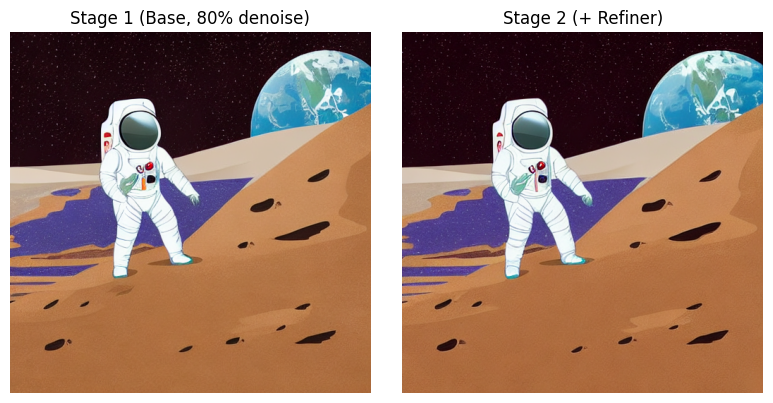

In [9]:
img2img_pipe = StableDiffusionImg2ImgPipeline(**pipe.components).to(DEVICE)
img2img_pipe.set_progress_bar_config(disable=False)


def two_stage_generation(
    prompt, negative_prompt, seed,
    total_steps=40, denoising_split=0.8,
    guidance_scale=4.5,
):
    base_steps = max(1, int(total_steps * denoising_split))

    gen1 = torch.Generator(device=DEVICE).manual_seed(seed)
    latent = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=gen1,
        num_inference_steps=base_steps,
        guidance_scale=guidance_scale,
        output_type="latent",
    ).images

    with torch.no_grad():
        decoded = pipe.vae.decode(latent / pipe.vae.config.scaling_factor).sample
    base_image = pipe.image_processor.postprocess(decoded, output_type="pil")[0]

    gen2 = torch.Generator(device=DEVICE).manual_seed(seed)
    refined = img2img_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=base_image,
        strength=1.0 - denoising_split,
        num_inference_steps=total_steps,
        guidance_scale=guidance_scale,
        generator=gen2,
    ).images[0]

    return base_image, refined


base_only, refined = two_stage_generation(PROMPT, NEG_PROMPT, SEED)
show_grid([base_only, refined], ["Stage 1 (Base, 80% denoise)", "Stage 2 (+ Refiner)"])


## **Inpainting**

### **Load Model Inpainting**

In [10]:
INPAINT_MODEL_ID = "runwayml/stable-diffusion-inpainting"

inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    INPAINT_MODEL_ID,
    torch_dtype=DTYPE,
    safety_checker=None,
    requires_safety_checker=False,
).to(DEVICE)
inpaint_pipe.set_progress_bar_config(disable=False)


def inpaint_engine(image, mask, prompt,
                   negative_prompt,
                   seed=9,
                   guidance_scale=12.0,
                   num_inference_steps=60):
    if image.mode != "RGB":
        image = image.convert("RGB")
    if mask.mode != "L":
        mask = mask.convert("L")
    if image.size != mask.size:
        mask = mask.resize(image.size, resample=Image.NEAREST)

    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    out = inpaint_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image,
        mask_image=mask,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
    ).images[0]
    return out

print("Inpaint pipeline siap.")


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Inpaint pipeline siap.


### **Manual Masking**

base_inpaint.jpg tidak ditemukan -> generate gambar dasar dari prompt utama.


  0%|          | 0/50 [00:00<?, ?it/s]

Ukuran gambar dasar: (512, 512)


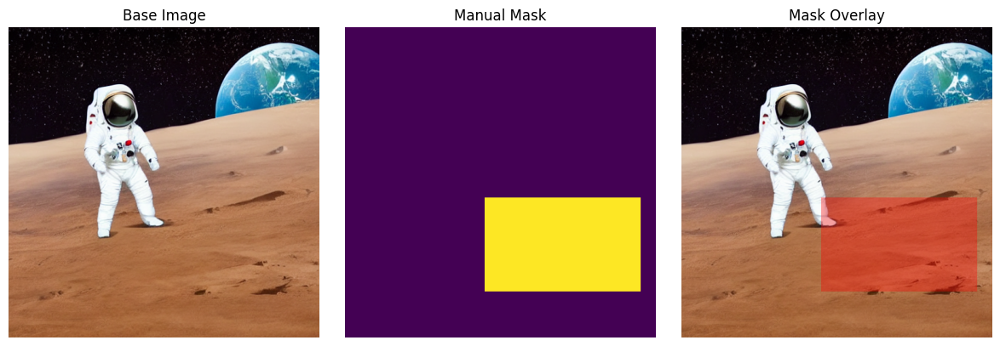

In [11]:
BASE_IMG_PATH = "base_inpaint.jpg"

if os.path.exists(BASE_IMG_PATH):
    base_image = Image.open(BASE_IMG_PATH).convert("RGB").resize((512, 512))
else:
    print("base_inpaint.jpg tidak ditemukan -> generate gambar dasar dari prompt utama.")
    base_image = generate_advanced_image(
        prompt=PROMPT,
        negative_prompt=NEG_PROMPT,
        seed=SEED,
        guidance_scale=5.0,
        num_inference_steps=50,
    )

W, H = base_image.size
print("Ukuran gambar dasar:", base_image.size)

# Mask: bagian kanan-bawah permukaan bulan, posisi tempat satelit jatuh.
manual_mask = Image.new("L", (W, H), 0)
draw = ImageDraw.Draw(manual_mask)
box = (int(W * 0.45), int(H * 0.55), int(W * 0.95), int(H * 0.85))
draw.rectangle(box, fill=255)

preview = base_image.copy()
overlay = Image.new("RGBA", (W, H), (255, 0, 0, 0))
ImageDraw.Draw(overlay).rectangle(box, fill=(255, 0, 0, 90))
preview = Image.alpha_composite(preview.convert("RGBA"), overlay).convert("RGB")
show_grid([base_image, manual_mask, preview],
          ["Base Image", "Manual Mask", "Mask Overlay"], cols=3)


### **Generate**

  0%|          | 0/60 [00:00<?, ?it/s]

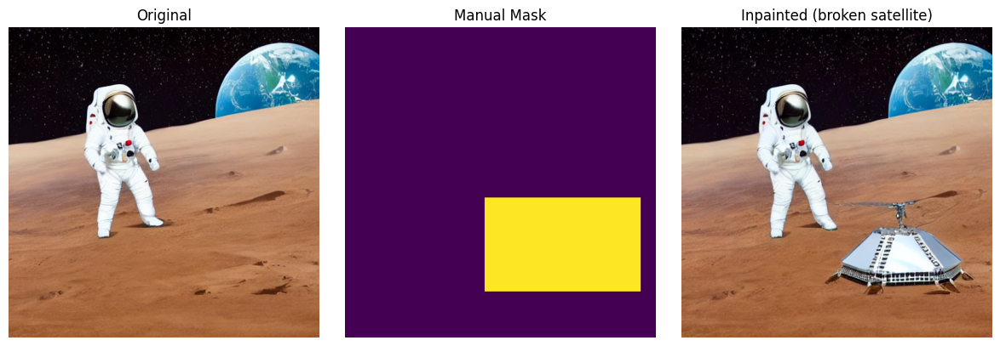

In [12]:
INPAINT_PROMPT = (
    "a large broken space lander with multiple metallic legs standing on the moon surface, "
    "shattered rectangular solar panels tilted at angles, exposed wires and antenna, "
    "dented metal body with reflective gold and silver foil, scattered mechanical debris around it, "
    "highly detailed sci-fi machinery, sharp focus, realistic scale, cinematic lighting"
)
INPAINT_NEG_PROMPT = (
    "blurry, low quality, distorted, messy, cartoon, drawing, painting, "
    "abstract shapes, scattered junk, deformed, ugly"
)
INPAINT_SEED = 9

result_manual = inpaint_engine(
    image=base_image,
    mask=manual_mask,
    prompt=INPAINT_PROMPT,
    negative_prompt=INPAINT_NEG_PROMPT,
    seed=INPAINT_SEED,
    guidance_scale=12.0,
    num_inference_steps=60,
)

show_grid([base_image, manual_mask, result_manual],
          ["Original", "Manual Mask", "Inpainted (broken satellite)"], cols=3)


## **Inpainting Menggunakan Automasking**

### **load Model Segmentation Untuk Masking**

In [13]:
SEG_MODEL_ID = "CIDAS/clipseg-rd64-refined"
seg_processor = CLIPSegProcessor.from_pretrained(SEG_MODEL_ID)
seg_model = CLIPSegForImageSegmentation.from_pretrained(SEG_MODEL_ID).to(DEVICE)
seg_model.eval()
print("Segmentation model siap.")


preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

The image processor of type `ViTImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/974 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/603M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/462 [00:00<?, ?it/s]

CLIPSegForImageSegmentation LOAD REPORT from: CIDAS/clipseg-rd64-refined
Key                                       | Status     |  | 
------------------------------------------+------------+--+-
clip.text_model.embeddings.position_ids   | UNEXPECTED |  | 
clip.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Segmentation model siap.


### **Masking with Segmentation Model**

/tmp/ipykernel_37305/3021104840.py:17: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  mask_img = Image.fromarray(binary, mode="L").resize(image.size, Image.NEAREST)


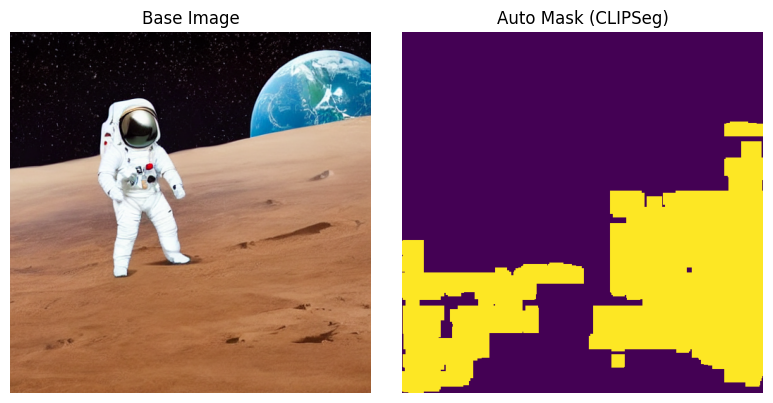

In [14]:
def auto_mask(image, target_prompt, threshold=0.4, dilate=10):
    inputs = seg_processor(
        text=[target_prompt],
        images=[image],
        padding=True,
        return_tensors="pt",
    ).to(DEVICE)

    with torch.no_grad():
        logits = seg_model(**inputs).logits
    if logits.ndim == 3:
        logits = logits[0]

    prob = torch.sigmoid(logits).cpu().numpy()
    binary = (prob > threshold).astype("uint8") * 255

    mask_img = Image.fromarray(binary, mode="L").resize(image.size, Image.NEAREST)
    if dilate > 0:
        mask_img = mask_img.filter(ImageFilter.MaxFilter(dilate * 2 + 1))
    return mask_img


# Target objek "moon surface" pada gambar dasar -> area tempat satelit akan diletakkan
auto_mask_img = auto_mask(base_image, "moon surface ground", threshold=0.4, dilate=8)
show_grid([base_image, auto_mask_img],
          ["Base Image", "Auto Mask (CLIPSeg)"], cols=2)


### **Generate**

  0%|          | 0/60 [00:00<?, ?it/s]

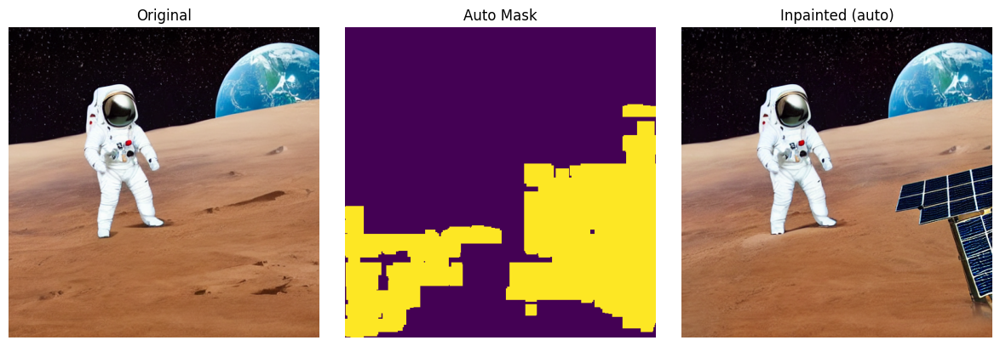

In [15]:
result_auto = inpaint_engine(
    image=base_image,
    mask=auto_mask_img,
    prompt=INPAINT_PROMPT,
    negative_prompt=INPAINT_NEG_PROMPT,
    seed=INPAINT_SEED,
    guidance_scale=12.0,
    num_inference_steps=60,
)

show_grid([base_image, auto_mask_img, result_auto],
          ["Original", "Auto Mask", "Inpainted (auto)"], cols=3)


## **Outpainting**

### **Prepare the Canvas**

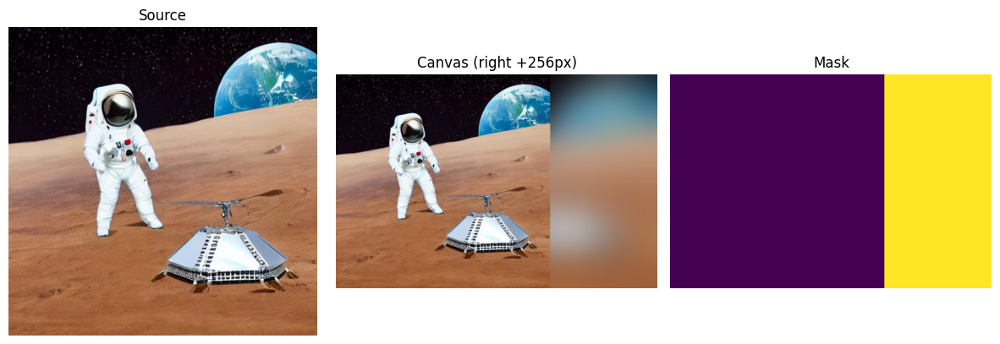

In [16]:
def prepare_outpainting(image, direction="right", expand_pixels=256, blur_radius=40):
    if image.mode != "RGB":
        image = image.convert("RGB")
    w, h = image.size
    if direction in ("left", "right"):
        new_w, new_h = w + expand_pixels, h
    elif direction in ("top", "bottom"):
        new_w, new_h = w, h + expand_pixels
    else:
        raise ValueError(f"direction harus left/right/top/bottom, dapat {direction}")

    new_w -= new_w % 8
    new_h -= new_h % 8

    bg = image.resize((new_w, new_h), Image.BICUBIC).filter(
        ImageFilter.GaussianBlur(radius=blur_radius)
    )
    canvas = bg.copy()

    if direction == "right":
        paste_xy = (0, 0)
    elif direction == "left":
        paste_xy = (new_w - w, 0)
    elif direction == "top":
        paste_xy = (0, new_h - h)
    else:
        paste_xy = (0, 0)

    canvas.paste(image, paste_xy)

    mask = Image.new("L", (new_w, new_h), 255)
    mask.paste(Image.new("L", (w, h), 0), paste_xy)

    return canvas, mask


out_canvas, out_mask = prepare_outpainting(result_manual, direction="right", expand_pixels=256)
show_grid([result_manual, out_canvas, out_mask],
          ["Source", "Canvas (right +256px)", "Mask"], cols=3)


### **Generate**

  0%|          | 0/60 [00:00<?, ?it/s]

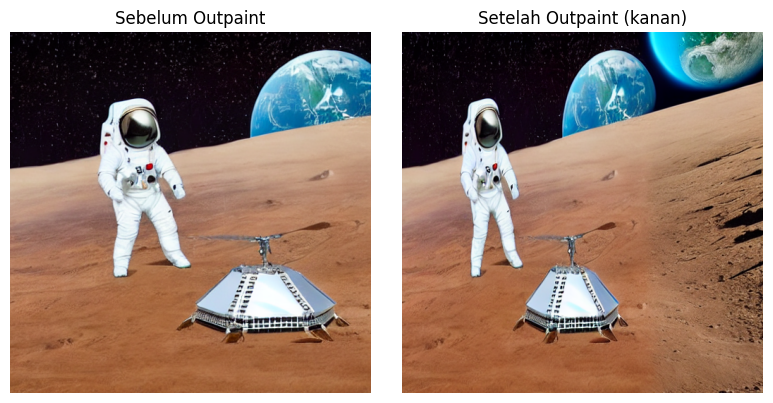

In [17]:
OUTPAINT_PROMPT = (
    "wide view of the moon surface with a broken satellite crashed on lunar terrain, "
    "earth in the background, stars, cosmic dust, photorealistic, cinematic lighting"
)

outpainted = inpaint_engine(
    image=out_canvas,
    mask=out_mask,
    prompt=OUTPAINT_PROMPT,
    negative_prompt=INPAINT_NEG_PROMPT,
    seed=INPAINT_SEED,
    guidance_scale=12.0,
    num_inference_steps=60,
)

show_grid([result_manual, outpainted],
          ["Sebelum Outpaint", "Setelah Outpaint (kanan)"], cols=2)


## **Outpainting Zoom Out**

### **Prepare Canvas for Zoom Out**

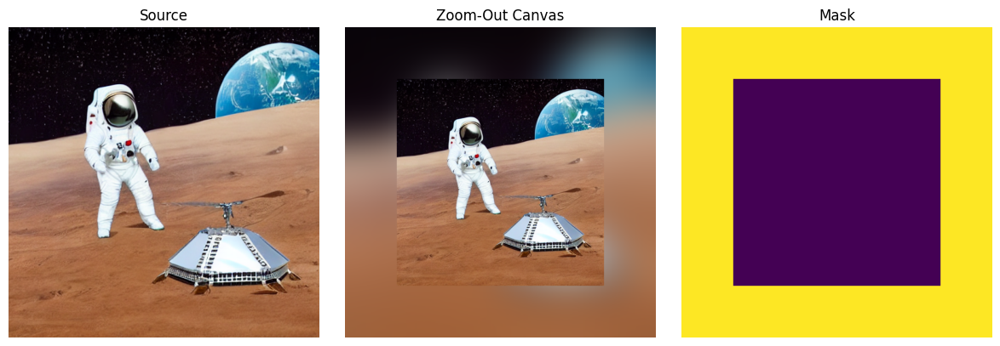

In [18]:
def prepare_zoom_out(image, expand_pixels=128, blur_radius=50):
    if image.mode != "RGB":
        image = image.convert("RGB")
    w, h = image.size
    new_w = w + 2 * expand_pixels
    new_h = h + 2 * expand_pixels
    new_w -= new_w % 8
    new_h -= new_h % 8

    bg = image.resize((new_w, new_h), Image.BICUBIC).filter(
        ImageFilter.GaussianBlur(radius=blur_radius)
    )
    canvas = bg.copy()
    paste_x = (new_w - w) // 2
    paste_y = (new_h - h) // 2
    canvas.paste(image, (paste_x, paste_y))

    mask = Image.new("L", (new_w, new_h), 255)
    mask.paste(Image.new("L", (w, h), 0), (paste_x, paste_y))
    return canvas, mask


zoom_canvas, zoom_mask = prepare_zoom_out(result_manual, expand_pixels=128)
show_grid([result_manual, zoom_canvas, zoom_mask],
          ["Source", "Zoom-Out Canvas", "Mask"], cols=3)


### **Generate**

In [19]:
DIRECTIONS = ["right", "bottom", "left", "top"]
EXPAND_PER_STEP = 128

current = result_manual
zoom_outputs = [current]

for step, direction in enumerate(DIRECTIONS):
    canvas, mask = prepare_outpainting(
        current, direction=direction, expand_pixels=EXPAND_PER_STEP
    )
    current = inpaint_engine(
        image=canvas,
        mask=mask,
        prompt=OUTPAINT_PROMPT,
        negative_prompt=INPAINT_NEG_PROMPT,
        seed=INPAINT_SEED + step,
        guidance_scale=12.0,
        num_inference_steps=60,
    )
    zoom_outputs.append(current)

titles = ["Step 0 (Source)"] + [
    f"Step {i+1}: + {d}" for i, d in enumerate(DIRECTIONS)
]
show_grid(
    zoom_outputs,
    titles,
    cols=len(zoom_outputs),
    figsize=(5 * len(zoom_outputs), 5),
)


Output hidden; open in https://colab.research.google.com to view.